# ***Introduction***
Identifying brain tumors from MRI scans is a critical challenge in medical imaging, with the goal of improving diagnosis and patient care. This project aims to develop a machine learning model capable of detecting and classifying various types of brain tumors.

In [2]:
!python --version

Python 3.10.16


# ***Libraries import***

In [3]:
import os
import io
import numpy as np
import pandas as pd
import seaborn as sns
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, 
    f1_score, roc_auc_score, classification_report, 
    mean_squared_error, confusion_matrix
)

import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, Flatten, Dense, Dropout, 
    ReLU, GlobalAveragePooling2D, Input
)
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import joblib
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import VGG16
import pickle
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from tensorflow.keras.layers import Conv2D, Dense, GlobalAveragePooling2D, GlobalMaxPooling2D, Reshape, multiply, add, Activation, Concatenate
from tensorflow.keras import backend as K

from tensorflow.keras.layers import (Input, Conv2D, Dense, Activation, GlobalAveragePooling2D, 
                                     GlobalMaxPooling2D, Reshape, multiply, add, Concatenate, 
                                     MaxPooling2D, Flatten, Dropout, ReLU, Lambda)
from tensorflow.keras.models import Model
import tensorflow.keras.backend as K
import numpy as np
from sklearn.metrics import classification_report, accuracy_score, log_loss
import tensorflow as tf
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt

# ***Data import***

**Traverses the directory structure and returns a Pandas DataFrame with the columns: id, image, and label**

In [17]:
import zipfile
import os

zip_path = 'archive (3).zip'  # or the exact filename if different

# Extract to a folder named 'data'
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('data')


In [10]:
def create_dataset(base_dir):
    data = []
    for label in os.listdir(base_dir):  
        class_dir = os.path.join(base_dir, label)
        for img_name in os.listdir(class_dir):  
            img_path = os.path.join(class_dir, img_name)
            if img_path.endswith(('.png', '.jpg', '.jpeg')):  
                
                img = Image.open(img_path)  
                data.append({"id": img_name, "image": img, "label": label})
    df = pd.DataFrame(data)
    
    return df

**Creation of the data sets Training and Test**

In [18]:
train_dir = 'data/Training'
test_dir = 'data/Testing'

In [19]:
train_df = create_dataset(train_dir)
test_df = create_dataset(test_dir)

**Creation of one global data set**

In [20]:
df = pd.concat([train_df, test_df], ignore_index=True)

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7023 entries, 0 to 7022
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      7023 non-null   object
 1   image   7023 non-null   object
 2   label   7023 non-null   object
dtypes: object(3)
memory usage: 164.7+ KB


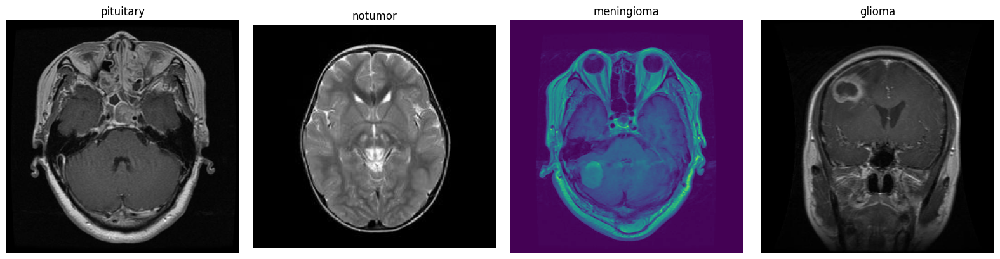

In [7]:
unique_labels = df['label'].unique()
fig, axes = plt.subplots(1, len(unique_labels), figsize=(4 * len(unique_labels), 4))

if len(unique_labels) == 1:
    axes = [axes]
for ax, label in zip(axes, unique_labels):
    example_row = df[df['label'] == label].iloc[0]  # First row with that label
    img = example_row['image']
    ax.imshow(img)
    ax.set_title(f"{label}")
    ax.axis('off')
plt.tight_layout()
plt.show()

In [22]:
labels_counts = df['label'].value_counts()
labels = labels_counts.index
values = labels_counts.values

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'domain'}]])

fig.add_trace(go.Pie(
    labels=labels,
    values=values,
    name="Labels",
    textinfo='label+percent',              
    textposition='inside',                
    insidetextfont=dict(color='white')    
), 1, 1)

fig.update_traces(hole=0.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Tumor type distribution",
    annotations=[dict(text='', x=0.5, y=0.5, font_size=20, showarrow=False)]
)

fig.show()

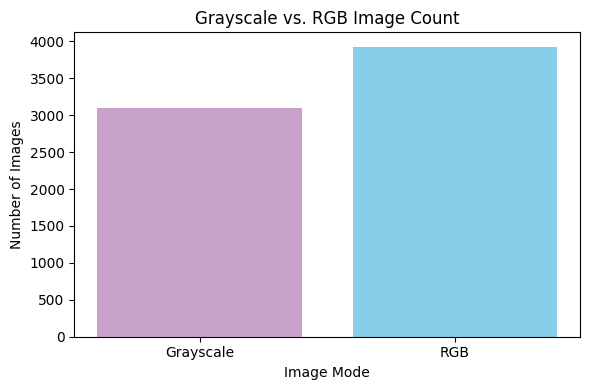

In [23]:
grayscale_count = 0
rgb_count = 0
for img in df['image']:  
    if img.mode == 'L':  
        grayscale_count += 1
    elif img.mode == 'RGB':  
        rgb_count += 1

modes = ['Grayscale', 'RGB']
counts = [grayscale_count, rgb_count]

plt.figure(figsize=(6, 4))
plt.bar(modes, counts, color=['#C8A2C8', 'skyblue'])  
plt.xlabel('Image Mode')
plt.ylabel('Number of Images')
plt.title('Grayscale vs. RGB Image Count')
plt.tight_layout()
plt.show()


In [15]:
grayscale_count = 0
rgb_count = 0
for img in df['image']:  
    if img.mode == 'L':  
        grayscale_count += 1
    elif img.mode == 'RGB':  
        rgb_count += 1

print(f"Number of grayscale images : {grayscale_count}")
print(f"Number of RGB images: {rgb_count}")

Number of grayscale images : 3093
Number of RGB images: 3926


In [16]:
df['image_sizes'] = df['image'].apply(lambda img: img.size)
print(df['image_sizes'].unique())

[(512, 512) (256, 256) (236, 218) (393, 400) (339, 340) (232, 217)
 (225, 225) (380, 530) (236, 236) (227, 222) (428, 417) (314, 258)
 (200, 252) (630, 630) (680, 680) (207, 225) (234, 218) (275, 183)
 (228, 221) (359, 449) (206, 244) (235, 227) (236, 251) (150, 198)
 (208, 242) (207, 243) (218, 231) (642, 361) (201, 251) (235, 229)
 (442, 442) (173, 201) (214, 236) (192, 192) (222, 252) (227, 262)
 (234, 224) (300, 168) (276, 326) (220, 275) (420, 280) (201, 250)
 (468, 444) (235, 214) (235, 261) (215, 234) (236, 295) (236, 231)
 (314, 260) (236, 300) (278, 253) (208, 225) (210, 234) (236, 260)
 (442, 454) (200, 248) (504, 540) (234, 234) (236, 257) (194, 259)
 (400, 442) (236, 270) (236, 290) (236, 262) (236, 263) (259, 194)
 (235, 228) (211, 236) (236, 243) (209, 234) (234, 225) (236, 213)
 (236, 273) (236, 252) (236, 268) (212, 238) (227, 213) (441, 442)
 (177, 197) (208, 248) (205, 249) (233, 226) (218, 234) (235, 233)
 (208, 217) (230, 282) (236, 228) (205, 214) (228, 228) (236, 

**Shuffling of the data set**

In [24]:
df_shuffled = df.sample(frac=1).reset_index(drop=True)

# ***Data preprocessing***

**Resizing and color normalization**

In [25]:
df['image_resized_244'] = df['image'].apply(lambda img: img.convert('RGB').resize((224, 224)))

In [26]:
df['image_resized_128'] = df['image'].apply(lambda img: img.convert('RGB').resize((128, 128)))

**Normalization**

In [27]:
df['image_array_224'] = df['image_resized_244'].apply(lambda img: np.array(img) / 255.0)

In [28]:
df['image_array_128'] = df['image_resized_128'].apply(lambda img: np.array(img) / 255.0)

In [29]:
df['image_vector'] = df['image_array_128'].apply(lambda img: np.array(img))

In [31]:
df['image_vector'] = df['image_vector'].apply(lambda img: img.flatten())

**One-hot encoding the labels**

In [32]:
num_classes = df['label'].nunique()
df['label_encoded'] = df['label'].astype('category').cat.codes
df['label_onehot'] = df['label_encoded'].apply(lambda x: to_categorical(x, num_classes=num_classes))

**This function creates a TensorFlow dataset from a DataFrame by generating (image, label) pairs, 
   and then batches them, and prefetches for efficient model training**


In [33]:
def data_generator(df, image_col, label_col):
    for _, row in df.iterrows():
        yield row[image_col], row[label_col]

def create_tf_dataset(df, batch_size, image_col='image_array', label_col='label_onehot'):
    generator = lambda: data_generator(df, image_col, label_col)

    output_types = (tf.float32, tf.float32)  
    output_shapes = (df[image_col].iloc[0].shape, df[label_col].iloc[0].shape)
    dataset = tf.data.Dataset.from_generator(generator, output_types, output_shapes)
    dataset = dataset.apply(tf.data.experimental.assert_cardinality(len(df)))
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    return dataset

**Splitting the data into 80% training, 20% Test and 10% Validation**

In [34]:
train_val_df, val_df = train_test_split(df, test_size=0.1, random_state=42)
train_df, test_df = train_test_split(train_val_df, test_size=0.2, random_state=42)

**Creating Tensorflow datasets for Training ,Validation and Testing**

In [35]:
BATCH_SIZE=32

In [36]:
train_tf_dataset_224 = create_tf_dataset(train_df,BATCH_SIZE, 'image_array_224', 'label_onehot')

Instructions for updating:
Use output_signature instead
Instructions for updating:
Use output_signature instead


In [37]:
train_tf_dataset_128 = create_tf_dataset(train_df, BATCH_SIZE, 'image_array_128', 'label_onehot')

In [38]:
val_tf_dataset_224   = create_tf_dataset(val_df, BATCH_SIZE, 'image_array_224', 'label_onehot')

In [39]:
val_tf_dataset_128   = create_tf_dataset(val_df, BATCH_SIZE, 'image_array_128', 'label_onehot')

In [40]:
test_tf_dataset_224  = create_tf_dataset(test_df, BATCH_SIZE, 'image_array_224', 'label_onehot')

In [41]:
test_tf_dataset_224  = create_tf_dataset(test_df, BATCH_SIZE, 'image_array_128', 'label_onehot')

**Custom Keras callback to compute and store detailed evaluation metrics**

In [44]:
class MetricsCallback(Callback):
    def __init__(self, train_data, val_data):
        self.train_data = train_data
        self.val_data = val_data
        self.train_metrics = []
        self.val_metrics = []

    def on_epoch_end(self, epoch, logs=None):
        for name, dataset in zip(['Train', 'Validation'], [self.train_data, self.val_data]):
            y_true, y_pred, y_prob = [], [], []
            for x_batch, y_batch in dataset:
                preds = self.model.predict(x_batch, verbose=0)
                y_prob.extend(preds)
                y_pred.extend(np.argmax(preds, axis=1))
                y_true.extend(np.argmax(y_batch, axis=1))
            y_true = np.array(y_true)
            y_pred = np.array(y_pred)
            y_prob = np.array(y_prob)
            acc = np.mean(y_true == y_pred)
            prec = precision_score(y_true, y_pred, average='macro', zero_division=0)
            rec = recall_score(y_true, y_pred, average='macro', zero_division=0)
            f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)
            try:
                auc = roc_auc_score(to_categorical(y_true), y_prob, multi_class='ovr')
            except ValueError:
                auc = float('nan')

            print(f"{name} - Accuracy: {acc:.4f}, Precision: {prec:.4f}, Recall: {rec:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")

            if name == 'Train':
                self.train_metrics.append({
                    'epoch': epoch, 'accuracy': acc, 'precision': prec,
                    'recall': rec, 'f1': f1, 'auc': auc
                })
            else:
                self.val_metrics.append({
                    'epoch': epoch, 'accuracy': acc, 'precision': prec,
                    'recall': rec, 'f1': f1, 'auc': auc
                })

        self.save_metrics()

    def save_metrics(self):
        with open('train_metrics.pkl', 'wb') as f:
            pickle.dump(self.train_metrics, f)
        with open('val_metrics.pkl', 'wb') as f:
            pickle.dump(self.val_metrics, f)

    def get_train_metrics(self):
        return self.train_metrics

    def get_val_metrics(self):
        return self.val_metrics


In [43]:
import numpy as np
import pickle
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt

# Custom MetricsCallback (manual version)
class MetricsCallback:
    def __init__(self, train_data, val_data):
        self.train_data = train_data
        self.val_data = val_data
        self.train_metrics = []
        self.val_metrics = []

    def compute_metrics(self, model, epoch):
        for name, dataset, metric_list in zip(
            ['Train', 'Validation'],
            [self.train_data, self.val_data],
            [self.train_metrics, self.val_metrics]
        ):
            y_true, y_pred, y_prob = [], [], []
            for x_batch, y_batch in dataset:
                preds = model.predict(x_batch, verbose=0)
                y_prob.extend(preds)
                y_pred.extend(np.argmax(preds, axis=1))
                y_true.extend(np.argmax(y_batch, axis=1))
            y_true = np.array(y_true)
            y_pred = np.array(y_pred)
            y_prob = np.array(y_prob)
            acc = np.mean(y_true == y_pred)
            prec = precision_score(y_true, y_pred, average='macro', zero_division=0)
            rec = recall_score(y_true, y_pred, average='macro', zero_division=0)
            f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)
            try:
                auc = roc_auc_score(to_categorical(y_true), y_prob, multi_class='ovr')
            except ValueError:
                auc = float('nan')

            print(f"{name} - Accuracy: {acc:.4f}, Precision: {prec:.4f}, Recall: {rec:.4f}, F1: {f1:.4f}, AUC: {auc:.4f}")

            metric_list.append({
                'epoch': epoch,
                'accuracy': acc,
                'precision': prec,
                'recall': rec,
                'f1': f1,
                'auc': auc
            })

        self.save_metrics()

    def save_metrics(self):
        with open('train_metrics.pkl', 'wb') as f:
            pickle.dump(self.train_metrics, f)
        with open('val_metrics.pkl', 'wb') as f:
            pickle.dump(self.val_metrics, f)



**A function that prepares metrics for plotting**

In [45]:
def extract_metrics(metrics):
    return {
        'accuracy': [metric['accuracy'] for metric in metrics],
        'precision': [metric['precision'] for metric in metrics],
        'recall': [metric['recall'] for metric in metrics],
        'f1': [metric['f1'] for metric in metrics],
        'auc': [metric['auc'] for metric in metrics]
    }

# ***Training different models + Performance evaluation***

# *Custom CNN*

***Stopping the training process when the model no longer improves***

In [26]:
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=2,
    verbose=1,
    min_lr=1e-6
)

In [38]:
model_cnn.save("/kaggle/working/best_model_cnn.keras")


***Saving the best version of the model***

In [32]:
checkpoint_cnn = ModelCheckpoint(
    filepath='best_model_cnn.keras',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1 
)

***CNN Creation***

In [40]:
model_cnn = Sequential()

# Conv_1: Convolution -> (5x5 kernel, valid padding)
model_cnn.add(Conv2D(filters=32, kernel_size=(5,5), padding='valid', input_shape=(224, 224, 3)))
model_cnn.add(MaxPooling2D(pool_size=(2,2)))

# Conv_2: Convolution -> (5x5 kernel, valid padding)
model_cnn.add(Conv2D(filters=64, kernel_size=(5,5), padding='valid'))
model_cnn.add(MaxPooling2D(pool_size=(2,2)))

# Flatten before fully connected
model_cnn.add(Flatten())

# Fully connected layer + ReLU
model_cnn.add(Dense(1024))
model_cnn.add(ReLU())

# Dropout for regularization
model_cnn.add(Dropout(0.5))

# Final output layer with 4 units 
model_cnn.add(Dense(4, activation='softmax'))

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [41]:
metrics_callback = MetricsCallback(
    train_data=train_tf_dataset_224,
    val_data=val_tf_dataset_224,
)

***Compiling the model***

In [42]:
model_cnn.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

***Fitting the model***

In [ ]:
train_tf_dataset_224,
    validation_data=val_tf_dataset_224,
    epochs=10,             
    verbose=1,
    callbacks=[early_stop, checkpoint_cnn, reduce_lr, metrics_callback]
)

    

Epoch 1/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9661 - loss: 0.1060
Epoch 1: val_loss improved from 0.21943 to 0.19565, saving model to best_model_cnn.keras
Train - Accuracy: 0.9941, Precision: 0.9939, Recall: 0.9936, F1: 0.9937, AUC: 0.9999
Validation - Accuracy: 0.9246, Precision: 0.9200, Recall: 0.9176, F1: 0.9176, AUC: 0.9900
158/158 ━━━━━━━━━━━━━━━━━━━━ 840s 5s/step - accuracy: 0.9662 - loss: 0.1058 - val_accuracy: 0.9246 - val_loss: 0.1956 - learning_rate: 2.0000e-04
Epoch 2/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9847 - loss: 0.0665
Epoch 2: val_loss improved from 0.19565 to 0.18588, saving model to best_model_cnn.keras
Train - Accuracy: 0.9972, Precision: 0.9971, Recall: 0.9971, F1: 0.9971, AUC: 1.0000
Validation - Accuracy: 0.9232, Precision: 0.9175, Recall: 0.9159, F1: 0.9161, AUC: 0.9910
158/158 ━━━━━━━━━━━━━━━━━━━━ 842s 5s/step - accuracy: 0.9847 - loss: 0.0664 - val_accuracy: 0.9232 - val_loss: 0.1859 - learning_rate: 2.0000e-04
Epoch 3/10

In [51]:
model_cnn.save("model_cnn.keras")

In [52]:
train_metrics_cnn = metrics_callback.get_train_metrics()
val_metrics_cnn = metrics_callback.get_val_metrics()

***Plotting the evolution of the loss and the accuracy of the model for the training set and the validation set***

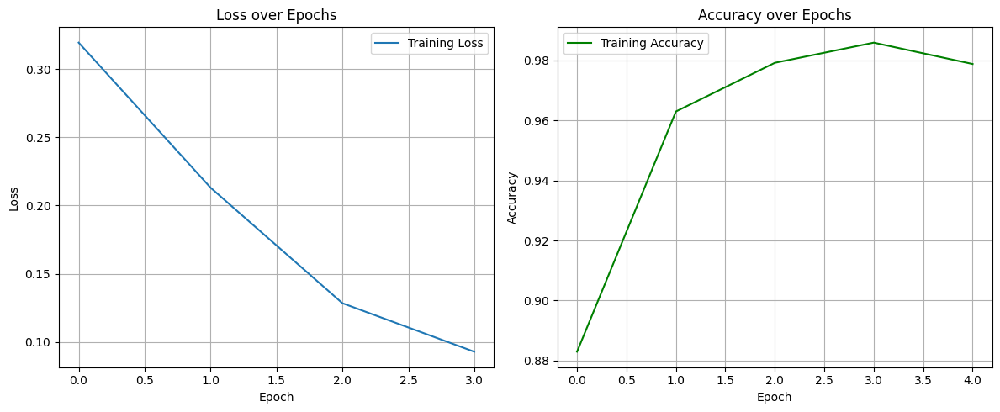

In [53]:
plt.figure(figsize=(12, 5))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(history_cnn.history['loss'], label='Training Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

# Plot training and validation accuracy
train_accuracies = [metric['accuracy'] for metric in train_metrics_cnn]
val_accuracies = [metric['accuracy'] for metric in val_metrics_cnn]

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy', color='green')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

The CNN model shows clear signs of overfitting: training loss rapidly drops to near-zero and training accuracy reaches 100%, while validation loss levels off early and validation accuracy remains around 93%, indicating the model has memorized the training data but struggles to generalize well to unseen data

***Testing the model***

In [54]:
y_true = []
y_pred = []
y_prob = []

for x_batch, y_batch in test_tf_dataset_224:
    x_batch_resized = tf.image.resize(x_batch, (224, 224))  # Resize if needed
    preds = model_cnn(x_batch_resized, training=False).numpy()

    y_prob.extend(preds)
    y_pred.extend(np.argmax(preds, axis=1))
    y_true.extend(np.argmax(y_batch, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_prob = np.array(y_prob)

test_accuracy = accuracy_score(y_true, y_pred)
test_loss = log_loss(y_true, y_prob)

print(f"\nOverall Accuracy: {test_accuracy:.4f}")
print(f"Overall Log Loss: {test_loss:.4f}")

print("\nPer-Class Precision, Recall, F1:")
print(classification_report(y_true, y_pred, digits=4, zero_division=0))



Overall Accuracy: 0.8592
Overall Log Loss: 0.3968

Per-Class Precision, Recall, F1:
              precision    recall  f1-score   support

           0     0.9782    0.7066    0.8205       317
           1     0.6473    0.9588    0.7729       291
           2     0.9899    0.8497    0.9145       346
           3     0.9414    0.9323    0.9368       310

    accuracy                         0.8592      1264
   macro avg     0.8892    0.8618    0.8612      1264
weighted avg     0.8962    0.8592    0.8638      1264



The CNN model performs well with an accuracy of 91.14%, precision of 91.60%, and recall of 91.11%, indicating it correctly identifies most positives and minimizes false positives. The F1 score of 91.06% reflects a good balance between precision and recall. With an AUC of 98.57%, the model shows excellent ability to distinguish between classes. 

***Metrics Dataframe***

In [57]:
metrics_results_cnn = [
    { 
        'model': 'CNN', 
        'data': 'Train', 
        'accuracy': train_metrics_cnn[-1]['accuracy'], 
        'precision': train_metrics_cnn[-1]['precision'], 
        'recall': train_metrics_cnn[-1]['recall'], 
        'f1': train_metrics_cnn[-1]['f1'], 
        'auc': train_metrics_cnn[-1]['auc'] 
    },
    { 
        'model': 'CNN', 
        'data': 'Validation', 
        'accuracy': val_metrics_cnn[-1]['accuracy'], 
        'precision': val_metrics_cnn[-1]['precision'], 
        'recall': val_metrics_cnn[-1]['recall'], 
        'f1': val_metrics_cnn[-1]['f1'], 
        'auc': val_metrics_cnn[-1]['auc'] 
    },
    { 
        'model': 'CNN', 
        'data': 'Test', 
        'accuracy': test_accuracy, 
        'precision': test_precision, 
        'recall': test_recall, 
        'f1': test_f1, 
        'auc': test_auc 
    }
]


In [58]:
metrics_df_cnn = pd.DataFrame(metrics_results_cnn)
print(metrics_df_cnn)

  model        data  accuracy  precision    recall        f1       auc
0   CNN       Train  0.978837   0.979580  0.976659  0.977225  0.999414
1   CNN  Validation  0.897582   0.904097  0.890770  0.887903  0.988221
2   CNN        Test  0.859177   0.889191  0.861839  0.861155  0.980128


In [59]:
metrics_df_cnn.to_pickle('metrics_df_cnn.pkl')

***ROC curve***

/tmp/ipykernel_31/1347012446.py:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



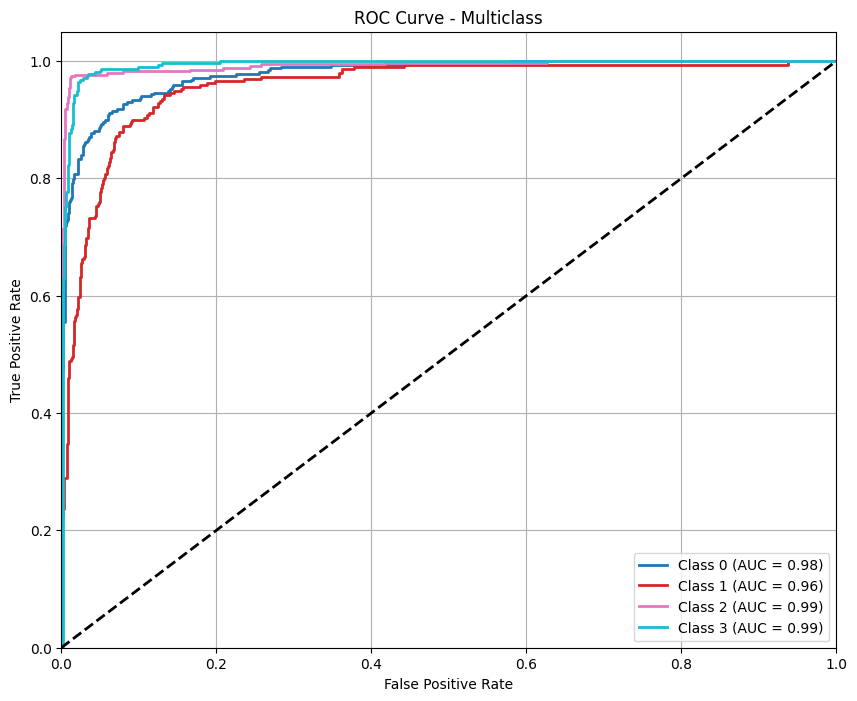

In [60]:
n_classes = y_prob.shape[1]
y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
plt.figure(figsize=(10, 8))

colors = plt.cm.get_cmap('tab10', n_classes)  

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors(i),
             lw=2, label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)  
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multiclass')
plt.legend(loc="lower right")
plt.grid()
plt.show()

The curves for most of the classes are very close to 90 degrees, indicating a very strong performance of the model in distinguishing these classes. 
However, class 0 and class 1 show a slight deviation from the 90-degree angle which could be due to factors such as overlapping features with other classes.

***Confusion Matrix***

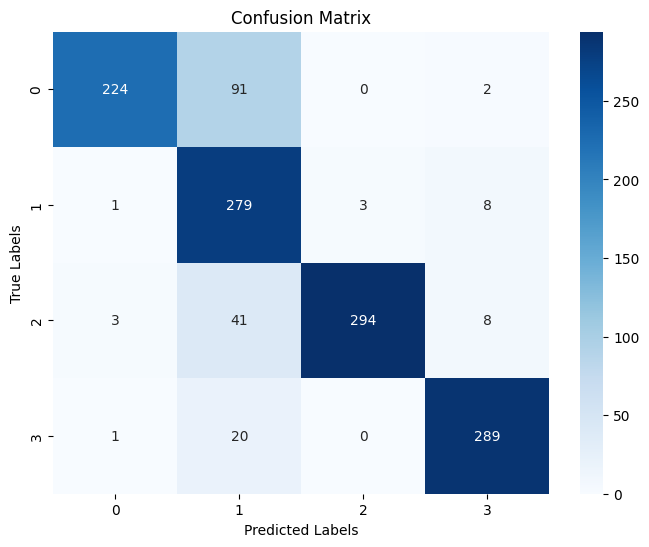

In [61]:
cm_cnn = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

The confusion matrix shows that the model performs well overall, with most classes being correctly predicted. For class 0, 269 instances are correctly predicted, while 46 instances are misclassified as class 1. Class 1 has only 9 instances misclassified as class 0. This indicates that the model is generally effective in distinguishing between most classes, but there is some confusion between class 0 and class 1.

# *CNN with spatial and channel attention*

In [ ]:
def cbam_block(input_feature, reduction_ratio=8):
    channel = input_feature
    channel_avg_pool = GlobalAveragePooling2D()(channel)
    channel_max_pool = GlobalMaxPooling2D()(channel)
    
    shared_dense_one = Dense(K.int_shape(channel)[-1] // reduction_ratio, activation='relu')
    shared_dense_two = Dense(K.int_shape(channel)[-1])

    mlp_avg = shared_dense_two(shared_dense_one(channel_avg_pool))
    mlp_max = shared_dense_two(shared_dense_one(channel_max_pool))
    
    channel_attention = Activation('sigmoid')(add([mlp_avg, mlp_max]))
    channel_attention = Reshape((1, 1, K.int_shape(channel)[-1]))(channel_attention)
    channel_refined = multiply([channel, channel_attention])

    spatial = channel_refined

    avg_pool = lambda(lambda x: K.mean(x, axis=-1, kee=True(spatial)


In [30]:
input_layer = Input(shape=(224, 224, 3))

# Conv_1 + Attention
x = Conv2D(filters=32, kernel_size=(5,5), padding='valid')(input_layer)
x = cbam_block(x)
x = MaxPooling2D(pool_size=(2,2))(x)

# Conv_2 + Attention
x = Conv2D(filters=64, kernel_size=(5,5), padding='valid')(x)
x = cbam_block(x)
x = MaxPooling2D(pool_size=(2,2))(x)

# Flatten and Fully Connected
x = Flatten()(x)
x = Dense(1024)(x)
x = ReLU()(x)
x = Dropout(0.5)(x)

# Output
output_layer = Dense(4, activation='softmax')(x)

# Final model
model_cnn_attention = Model(inputs=input_layer, outputs=output_layer)


In [31]:
metrics_callback = MetricsCallback(
    train_data=train_tf_dataset_224,
    val_data=val_tf_dataset_224,
)

***Compiling the model***

In [32]:
model_cnn_attention.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [36]:
checkpoint_cnn = ModelCheckpoint(
    filepath='best_model_cnn_attention.keras',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
    verbose=1 
)

***Fitting the model***

In [37]:
history_cnn_attention = model_cnn_attention.fit(
    train_tf_dataset_224,
    validation_data=val_tf_dataset_224,
    epochs=5,             
    verbose=1,
    callbacks=[early_stop, checkpoint_cnn, reduce_lr, metrics_callback]
)

Epoch 1/5
158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.5558 - loss: 1.1215
Epoch 1: val_loss improved from inf to 0.56174, saving model to best_model_cnn_attention.keras
Train - Accuracy: 0.8022, Precision: 0.8443, Recall: 0.7876, F1: 0.7845, AUC: 0.9666
Validation - Accuracy: 0.7681, Precision: 0.8071, Recall: 0.7521, F1: 0.7408, AUC: 0.9529
158/158 ━━━━━━━━━━━━━━━━━━━━ 1040s 7s/step - accuracy: 0.5567 - loss: 1.1192 - val_accuracy: 0.7681 - val_loss: 0.5617 - learning_rate: 0.0010
Epoch 2/5
158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.8400 - loss: 0.4087
Epoch 2: val_loss improved from 0.56174 to 0.28441, saving model to best_model_cnn_attention.keras
Train - Accuracy: 0.9561, Precision: 0.9553, Recall: 0.9535, F1: 0.9537, AUC: 0.9959
Validation - Accuracy: 0.8762, Precision: 0.8731, Recall: 0.8667, F1: 0.8661, AUC: 0.9812
158/158 ━━━━━━━━━━━━━━━━━━━━ 1007s 6s/step - accuracy: 0.8401 - loss: 0.4083 - val_accuracy: 0.8762 - val_loss: 0.2844 - learning_rate: 0.0010
Ep

In [38]:
train_metrics_cnn = metrics_callback.get_train_metrics()
val_metrics_cnn = metrics_callback.get_val_metrics()

***Plotting the evolution of the loss and the accuracy of the model for the training set and the validation set***

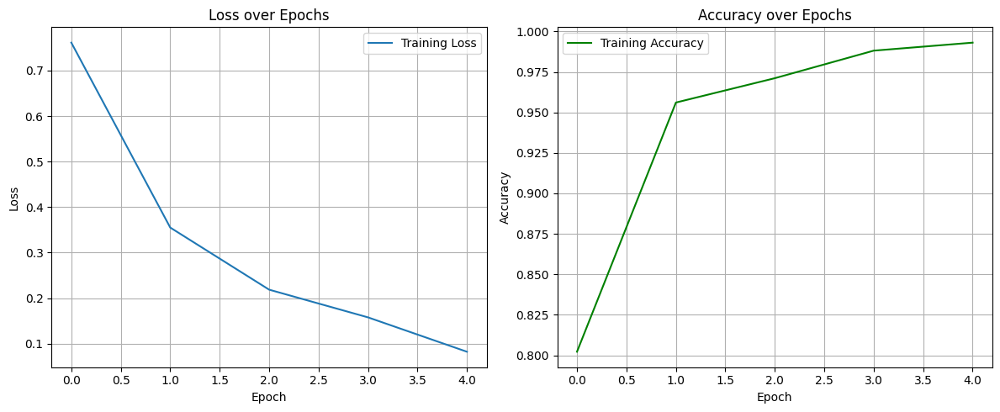

In [39]:
plt.figure(figsize=(12, 5))

# Plot training and validation loss
plt.subplot(1, 2, 1)
plt.plot(history_cnn_attention.history['loss'], label='Training Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

# Plot training and validation accuracy
train_accuracies = [metric['accuracy'] for metric in train_metrics_cnn]


plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy', color='green')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

With the addition of spatial and channel attention, the CNN shows improved generalization: validation accuracy steadily rises and closes the gap with training accuracy, while validation loss decreases more consistently, indicating that attention mechanisms help the model focus on more relevant features and reduce overfitting.

In [40]:
y_true = []
y_pred = []
y_prob = []

for x_batch, y_batch in test_tf_dataset_224:
    x_batch_resized = tf.image.resize(x_batch, (224, 224))  # Resize if needed
    preds = model_cnn_attention(x_batch_resized, training=False).numpy()

    y_prob.extend(preds)
    y_pred.extend(np.argmax(preds, axis=1))
    y_true.extend(np.argmax(y_batch, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_prob = np.array(y_prob)

test_accuracy = accuracy_score(y_true, y_pred)
test_loss = log_loss(y_true, y_prob)

print(f"\nOverall Accuracy: {test_accuracy:.4f}")
print(f"Overall Log Loss: {test_loss:.4f}")

print("\nPer-Class Precision, Recall, F1:")
print(classification_report(y_true, y_pred, digits=4, zero_division=0))



Overall Accuracy: 0.9035
Overall Log Loss: 0.3507

Per-Class Precision, Recall, F1:
              precision    recall  f1-score   support

           0     0.8407    0.8991    0.8689       317
           1     0.8169    0.8282    0.8225       291
           2     0.9850    0.9480    0.9661       346
           3     0.9697    0.9290    0.9489       310

    accuracy                         0.9035      1264
   macro avg     0.9031    0.9011    0.9016      1264
weighted avg     0.9064    0.9035    0.9045      1264



In [43]:
test_accuracy = accuracy_score(y_true, y_pred)
test_precision = precision_score(y_true, y_pred, average='macro', zero_division=0)
test_recall = recall_score(y_true, y_pred, average='macro', zero_division=0)
test_f1 = f1_score(y_true, y_pred, average='macro', zero_division=0)
test_auc = roc_auc_score(tf.keras.utils.to_categorical(y_true), y_prob, multi_class='ovr')
print(f"Accuracy: {test_accuracy:.4f}")
print(f"Precision: {test_precision:.4f}")
print(f"Recall: {test_recall:.4f}")
print(f"F1 Score: {test_f1:.4f}")
print(f"AUC: {test_auc:.4f}")

Accuracy: 0.8924
Precision: 0.8905
Recall: 0.8901
F1 Score: 0.8899
AUC: 0.9784


The improved CNN model with spatial and channel attention performs well with an accuracy of 89.24%, precision of 89.05%, and recall of 89.01%, indicating it correctly identifies most positives while minimizing false positives. The F1 score of 88.99% reflects a balanced trade-off between precision and recall. With an AUC of 97.84%, the model demonstrates strong ability to distinguish between classes. Overall, it shows solid performance and benefits from the added attention mechanisms.

***Metrics Dataframe***

In [44]:
metrics_results_cnn = [
    { 
        'model': 'CNN_attention', 
        'data': 'Train', 
        'accuracy': train_metrics_cnn[-1]['accuracy'], 
        'precision': train_metrics_cnn[-1]['precision'], 
        'recall': train_metrics_cnn[-1]['recall'], 
        'f1': train_metrics_cnn[-1]['f1'], 
        'auc': train_metrics_cnn[-1]['auc'] 
    },
    { 
        'model': 'CNN_attention', 
        'data': 'Validation', 
        'accuracy': val_metrics_cnn[-1]['accuracy'], 
        'precision': val_metrics_cnn[-1]['precision'], 
        'recall': val_metrics_cnn[-1]['recall'], 
        'f1': val_metrics_cnn[-1]['f1'], 
        'auc': val_metrics_cnn[-1]['auc'] 
    },
    { 
        'model': 'CNN_attention', 
        'data': 'Test', 
        'accuracy': test_accuracy, 
        'precision': test_precision, 
        'recall': test_recall, 
        'f1': test_f1, 
        'auc': test_auc 
    }
]

In [45]:
metrics_df_cnn_attention = pd.DataFrame(metrics_results_cnn)
print(metrics_df_cnn_attention)

           model        data  accuracy  precision    recall        f1  \
0  CNN_attention       Train  0.991693   0.991379  0.992082  0.991684   
1  CNN_attention  Validation  0.897582   0.890579  0.891177  0.890349   
2  CNN_attention        Test  0.892405   0.890467  0.890091  0.889926   

        auc  
0  0.999830  
1  0.984436  
2  0.978368  


In [46]:
metrics_df_cnn_attention.to_pickle('metrics_df_cnn_attention.pkl')

***ROC curve***

/tmp/ipykernel_14760/1347012446.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', n_classes)


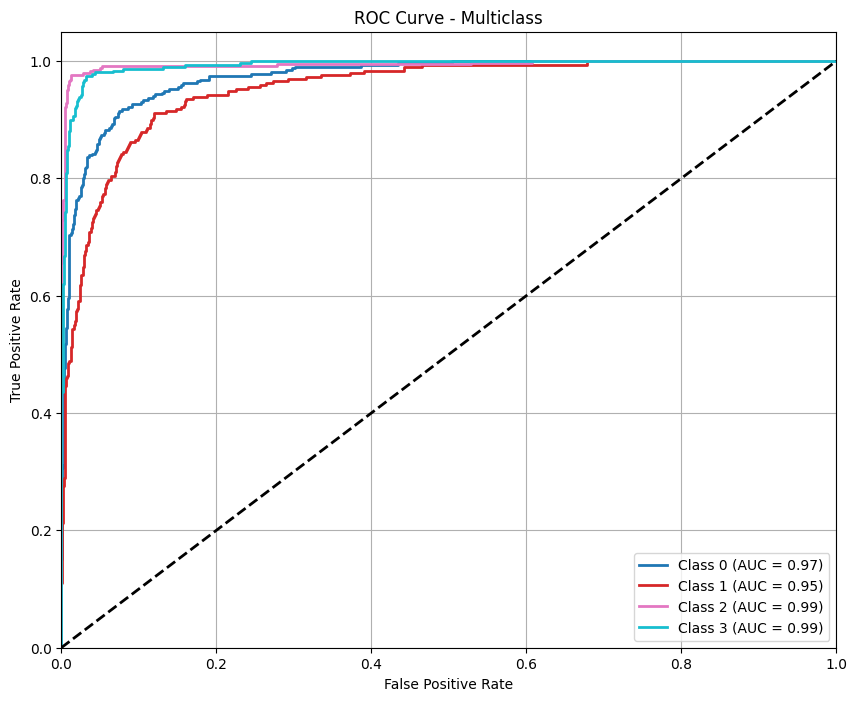

In [47]:
n_classes = y_prob.shape[1]
y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
plt.figure(figsize=(10, 8))

colors = plt.cm.get_cmap('tab10', n_classes)  

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors(i),
             lw=2, label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)  
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multiclass')
plt.legend(loc="lower right")
plt.grid()
plt.show()

The ROC curves show that the attention-based CNN performs slightly better for class 0 compared to the original model, while its performance for class 1 is slightly lower.

***Confusion matrix***

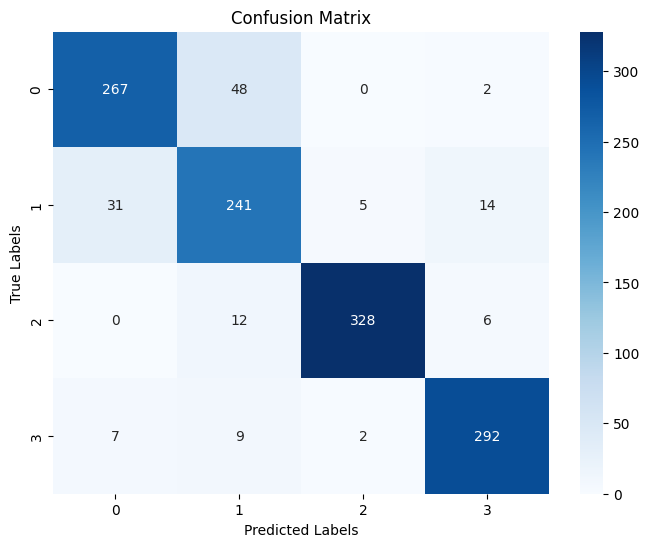

In [48]:
cm_cnn = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

The CNN model with attention mechanisms showed overall improved performance across most classes but made two fewer correct predictions for one class compared to the original model.

# *Resnet*

**Defining input**

In [27]:
input_tensor = Input(shape=(224, 224, 3))

**Loading base resnet model**

In [28]:
base_model = ResNet50(
    weights='/kaggle/input/resnetweights/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5',
    include_top=False,
    input_tensor=input_tensor
)

**Freezing the base model layers**

In [29]:
for layer in base_model.layers:
    layer.trainable = False

**Add custom layers on top**

In [30]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
output = Dense(4, activation='softmax')(x)

***Creating the resnet Model***

In [31]:
model_resnet = Model(inputs=base_model.input, outputs=output)

In [32]:
metrics_callback = MetricsCallback(
    train_data=train_tf_dataset_224,
    val_data=val_tf_dataset_224,
)

***Compiling the model***

In [33]:
model_resnet.compile(
    optimizer=Adam(learning_rate=0.007),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [34]:
checkpoint_resnet = ModelCheckpoint(
    filepath='best_model_resnet.keras',
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=False,
)

**Training the model**

In [35]:
callbacks = [early_stop, checkpoint_resnet, reduce_lr]


history_resnet = model_resnet.fit(
    train_tf_dataset_224,
    validation_data=val_tf_dataset_224,
    epochs=10,
    verbose=1,
    callbacks=callbacks
)


Epoch 1/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 536s 3s/step - accuracy: 0.3854 - loss: 1.6858 - val_accuracy: 0.5861 - val_loss: 0.9768 - learning_rate: 0.0070
Epoch 2/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 515s 3s/step - accuracy: 0.6088 - loss: 0.9415 - val_accuracy: 0.6743 - val_loss: 0.7921 - learning_rate: 0.0070
Epoch 3/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 490s 3s/step - accuracy: 0.6666 - loss: 0.7798 - val_accuracy: 0.6558 - val_loss: 0.8245 - learning_rate: 0.0070
Epoch 4/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 498s 3s/step - accuracy: 0.7041 - loss: 0.7057 - val_accuracy: 0.6814 - val_loss: 0.7862 - learning_rate: 0.0070
Epoch 5/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 462s 3s/step - accuracy: 0.7215 - loss: 0.6704 - val_accuracy: 0.7027 - val_loss: 0.7185 - learning_rate: 0.0070
Epoch 6/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 489s 3s/step - accuracy: 0.7380 - loss: 0.6454 - val_accuracy: 0.7226 - val_loss: 0.6831 - learning_rate: 0.0070
Epoch 7/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 459s 3s/step - accuracy: 0.7408 - loss: 0.

In [54]:
history_resnet = model_resnet.fit(
    train_tf_dataset_224,
    validation_data=val_tf_dataset_224,
    epochs=10,
    verbose=1,
    callbacks=[early_stop, checkpoint_resnet, reduce_lr, metrics_callback]
)

Epoch 1/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4260 - loss: 1.4589Train - Accuracy: 0.6464, Precision: 0.7287, Recall: 0.6418, F1: 0.5711, AUC: 0.8868
Validation - Accuracy: 0.6472, Precision: 0.7272, Recall: 0.6213, F1: 0.5593, AUC: 0.8754
158/158 ━━━━━━━━━━━━━━━━━━━━ 1261s 8s/step - accuracy: 0.4267 - loss: 1.4567 - val_accuracy: 0.6472 - val_loss: 0.8682 - learning_rate: 0.0065
Epoch 2/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6489 - loss: 0.8258Train - Accuracy: 0.6555, Precision: 0.6854, Recall: 0.6600, F1: 0.6410, AUC: 0.9009
Validation - Accuracy: 0.6373, Precision: 0.6623, Recall: 0.6271, F1: 0.6112, AUC: 0.8860
158/158 ━━━━━━━━━━━━━━━━━━━━ 1219s 8s/step - accuracy: 0.6490 - loss: 0.8256 - val_accuracy: 0.6373 - val_loss: 0.8606 - learning_rate: 0.0065
Epoch 3/10
158/158 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6893 - loss: 0.7354Train - Accuracy: 0.6907, Precision: 0.7061, Recall: 0.6864, F1: 0.6548, AUC: 0.9104
Validation - Accuracy: 0.68

In [36]:
train_metrics_resnet = metrics_callback.get_train_metrics()
val_metrics_resnet = metrics_callback.get_val_metrics()

***Plotting the evolution of the loss and the accuracy of the model for the training set and the validation set***

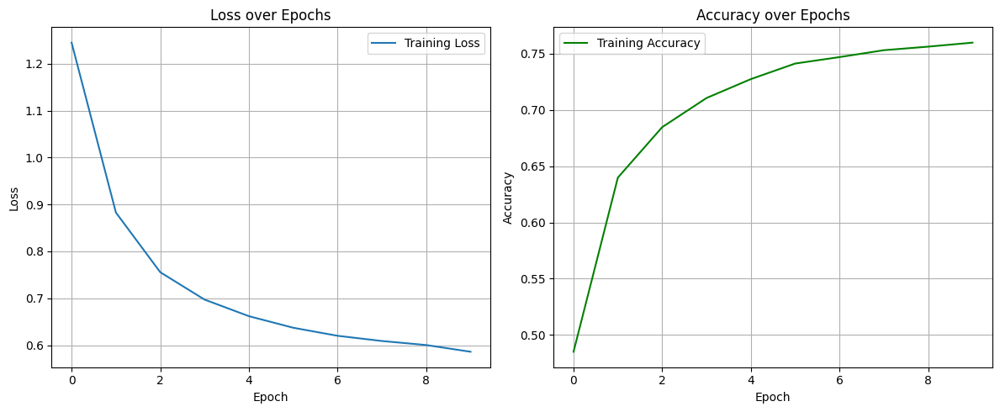

In [44]:
plt.figure(figsize=(12, 5))

# Plot training loss
plt.subplot(1, 2, 1)
plt.plot(history_resnet.history['loss'], label='Training Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()

# Plot training accuracy from history
plt.subplot(1, 2, 2)
plt.plot(history_resnet.history['accuracy'], label='Training Accuracy', color='green')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


The pretrained ResNet model learns well, as both training and validation loss decrease steadily and accuracy improves over time. The small difference between training and validation accuracy shows that the model generalizes well. The slight leveling off of validation accuracy near the end suggests the model is close to reaching its best performance without overfitting.

***Testing the model***

In [ ]:
model_resnet = tf.keras.models.load_model('best_model_resnet.keras')

In [41]:
y_true = []
y_pred = []
y_prob = []

for x_batch, y_batch in test_tf_dataset_224:
    x_batch_resized = tf.image.resize(x_batch, (224, 224))  
    preds = model_resnet(x_batch_resized, training=False).numpy()

    y_prob.extend(preds)
    y_pred.extend(np.argmax(preds, axis=1))
    y_true.extend(np.argmax(y_batch, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_prob = np.array(y_prob)

test_accuracy = accuracy_score(y_true, y_pred)
test_loss = log_loss(y_true, y_prob)

print(f"\nOverall Accuracy: {test_accuracy:.4f}")
print(f"Overall Log Loss: {test_loss:.4f}")

print("\nPer-Class Precision, Recall, F1:")
print(classification_report(y_true, y_pred, digits=4, zero_division=0))


Overall Accuracy: 0.7397
Overall Log Loss: 0.6454

Per-Class Precision, Recall, F1:
              precision    recall  f1-score   support

           0     0.6210    0.8580    0.7205       317
           1     0.6581    0.3505    0.4574       291
           2     0.9135    0.8237    0.8663       346
           3     0.7688    0.8903    0.8251       310

    accuracy                         0.7397      1264
   macro avg     0.7403    0.7306    0.7173      1264
weighted avg     0.7458    0.7397    0.7255      1264



The ResNet model performs well with an accuracy of 74.84%, showing a solid ability to classify correctly. Its precision (74.64%) and recall (74.11%) are balanced, indicating good performance in both minimizing false positives and capturing true positives. The F1 score of 73.50% reflects this balance, while the AUC of 92.34% shows strong class differentiation. Overall, the model is effective but could benefit from slight improvements in precision and recall balance.

***Metrics Dataframe***

In [64]:
metrics_results_resnet = [
    { 
        'model': 'Resnet', 
        'data': 'Train', 
        'accuracy': train_metrics_resnet[-1]['accuracy'], 
        'precision': train_metrics_resnet[-1]['precision'], 
        'recall': train_metrics_resnet[-1]['recall'], 
        'f1': train_metrics_resnet[-1]['f1'], 
        'auc': train_metrics_resnet[-1]['auc'] 
    },
    { 
        'model': 'Resnet', 
        'data': 'Validation', 
        'accuracy': val_metrics_resnet[-1]['accuracy'], 
        'precision': val_metrics_resnet[-1]['precision'], 
        'recall': val_metrics_resnet[-1]['recall'], 
        'f1': val_metrics_resnet[-1]['f1'], 
        'auc': val_metrics_resnet[-1]['auc'] 
    },
    { 
        'model': 'Resnet', 
        'data': 'Test', 
        'accuracy': test_accuracy, 
        'precision': test_precision, 
        'recall': test_recall, 
        'f1': test_f1, 
        'auc': test_auc 
    }
]

metrics_df_resnet = pd.DataFrame(metrics_results_resnet)

In [65]:
print(metrics_df_resnet)

    model        data  accuracy  precision    recall        f1       auc
0  Resnet       Train  0.799051   0.787740  0.790781  0.786050  0.943293
1  Resnet  Validation  0.775249   0.753782  0.755662  0.752049  0.931374
2  Resnet        Test  0.748418   0.746417  0.741059  0.735030  0.923364


In [68]:
metrics_df_resnet.to_pickle('metrics_df_resnet.pkl')

***ROC curve***

/tmp/ipykernel_31/1347012446.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', n_classes)


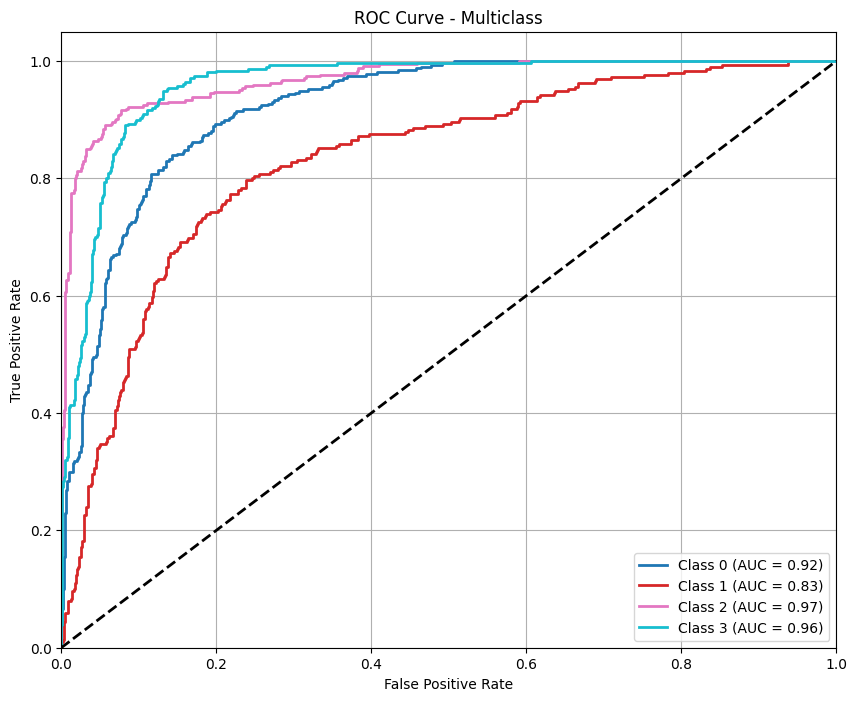

In [45]:
n_classes = y_prob.shape[1]
y_true_bin = label_binarize(y_true, classes=np.arange(n_classes))
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
plt.figure(figsize=(10, 8))

colors = plt.cm.get_cmap('tab10', n_classes)  

for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors(i),
             lw=2, label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)  
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Multiclass')
plt.legend(loc="lower right")
plt.grid()
plt.show()

The ROC curves show that the resnet model distinguishes Class 2 and Class 3 extremely well, Class 0 is still performing strongly but slightly below the first two, and Class 1 shows the weakest discrimination, indicating the model struggles more with this class

***Confusion Matrix***

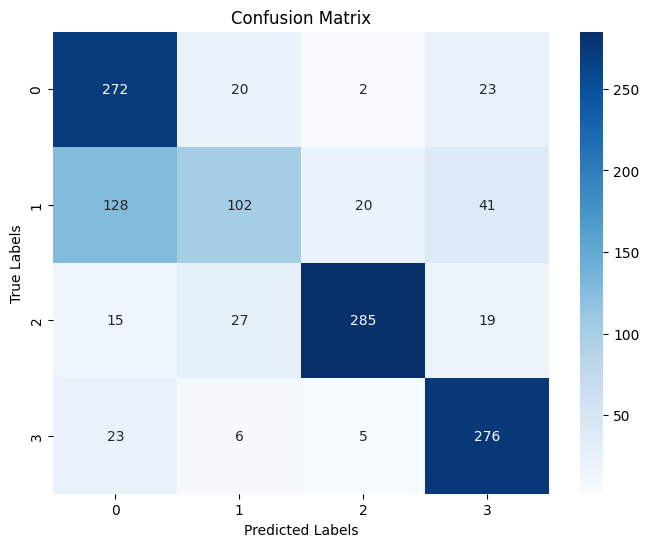

In [46]:
cm_resnet = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_resnet, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

The confusion matrix for the ResNet model demonstrates strong overall performance, with accurate predictions for most classes. However, class 1 shows a particular challenge, as 113 instances were misclassified as class 0, despite 127 correct predictions for class 1. This indicates that while the model performs well for class 1, there is some confusion between class 1 and class 0.

**SVM**

In [46]:
X = np.array(df['image_vector'].tolist())
y = df['label_encoded'].values 


In [47]:
accuracies = []
precisions = []
recalls = []
f1_scores = []
auc_scores = []

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
import numpy as np
best_accuracy = 0
best_model = None

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=i)
    
    clf = SVC(kernel='linear', probability=True) 
    clf.fit(X_train, y_train)
# Predictions and probabilities
y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)

# Unique class labels
class_labels = np.unique(y_test)

# Precision, Recall, F1-score per class
precision_per_class = precision_score(y_test, y_pred, average=None, labels=class_labels)
recall_per_class = recall_score(y_test, y_pred, average=None, labels=class_labels)
f1_per_class = f1_score(y_test, y_pred, average=None, labels=class_labels)

# AUC per class (requires one-hot encoding of y_test)
from sklearn.preprocessing import label_binarize
y_test_bin = label_binarize(y_test, classes=class_labels)

auc_per_class = []
for i in range(len(class_labels)):
    auc = roc_auc_score(y_test_bin[:, i], y_proba[:, i])
    auc_per_class.append(auc)

# Optionally, store in a dictionary or DataFrame
metrics_per_class = {
    'class': class_labels,
    'precision': precision_per_class,
    'recall': recall_per_class,
    'f1': f1_per_class,
    'auc': auc_per_class
}


In [ ]:
# Overall accuracy and log loss
accuracy = accuracy_score(y_test, y_pred)
loss = log_loss(y_test, y_proba)

# Print overall metrics
print(f"Overall Accuracy: {accuracy:.4f}")
print(f"Overall Log Loss: {loss:.4f}\n")

# Print per-class metrics (precision, recall, f1, support)
report = classification_report(y_test, y_pred, digits=4)
print("Per-Class Precision, Recall, F1:")
print(report)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Boxplot for overall accuracy and loss
plt.figure(figsize=(6, 4))
sns.boxplot(data=pd.DataFrame({'Accuracy': accuracies, 'Loss': losses}))
plt.title('Overall Accuracy and Loss')
plt.show()

# Convert per-class metric lists to long-form DataFrames
def to_long_df(scores, metric_name, class_labels):
    df = pd.DataFrame(scores, columns=class_labels)
    df = df.melt(var_name='Class', value_name=metric_name)
    return df

class_labels = ['0', '1', '2', '3']

df_prec = to_long_df(precision_scores, 'Precision', class_labels)
df_rec = to_long_df(recall_scores, 'Recall', class_labels)
df_f1 = to_long_df(f1_scores, 'F1-Score', class_labels)
df_auc = to_long_df(auc_scores, 'AUC', class_labels)

# Boxplots per class per metric
for df, metric in zip([df_prec, df_rec, df_f1, df_auc], ['Precision', 'Recall', 'F1-Score', 'AUC']):
    plt.figure(figsize=(7, 4))
    sns.boxplot(data=df, x='Class', y=metric)
    plt.title(f'{metric} per Class')
    plt.show()


In [ ]:
def flatten_scores(scores, metric_name):
    return pd.DataFrame({
        'Metric': metric_name,
        'Score': [score for run in scores for score in run]
    })

# Combine all metrics
df_all = pd.concat([
    flatten_scores(precision_scores, 'Precision'),
    flatten_scores(recall_scores, 'Recall'),
    flatten_scores(f1_scores, 'F1-Score'),
    flatten_scores(auc_scores, 'AUC')
])

# Plot one box per metric
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_all, x='Metric', y='Score')
plt.title('Per-Metric Boxplots (All Classes Pooled)')
plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you already have predictions
# y_test: true labels, y_pred: predicted labels
cm = confusion_matrix(y_test, y_pred)

# Optionally get class labels from data
class_labels = sorted(np.unique(y_test))

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


In [18]:
best_accuracy = 0
best_model = None

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=i)
    
    clf = SVC(kernel='linear', probability=True) 
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    y_proba = clf.predict_proba(X_test)
    auc = roc_auc_score(y_test, y_proba, multi_class='ovr')
    
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    auc_scores.append(auc)

    print(f"Iteration {i+1} - Accuracy: {accuracy * 100:.2f}%, Precision: {precision:.2f}, Recall: {recall:.2f}, F1-score: {f1:.2f}, AUC: {auc:.2f}")

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model = clf

joblib.dump(best_model, 'best_svm_model.pkl')


Iteration 1 - Accuracy: 88.83%, Precision: 0.89, Recall: 0.89, F1-score: 0.89, AUC: 0.97
Iteration 2 - Accuracy: 87.97%, Precision: 0.88, Recall: 0.88, F1-score: 0.88, AUC: 0.97
Iteration 3 - Accuracy: 88.47%, Precision: 0.89, Recall: 0.88, F1-score: 0.88, AUC: 0.97
Iteration 4 - Accuracy: 89.25%, Precision: 0.89, Recall: 0.89, F1-score: 0.89, AUC: 0.98
Iteration 5 - Accuracy: 87.69%, Precision: 0.88, Recall: 0.88, F1-score: 0.88, AUC: 0.97
Iteration 6 - Accuracy: 88.68%, Precision: 0.89, Recall: 0.89, F1-score: 0.89, AUC: 0.98
Iteration 7 - Accuracy: 88.75%, Precision: 0.89, Recall: 0.89, F1-score: 0.89, AUC: 0.98
Iteration 8 - Accuracy: 87.76%, Precision: 0.88, Recall: 0.88, F1-score: 0.88, AUC: 0.97
Iteration 9 - Accuracy: 89.32%, Precision: 0.89, Recall: 0.89, F1-score: 0.89, AUC: 0.98
Iteration 10 - Accuracy: 89.25%, Precision: 0.89, Recall: 0.89, F1-score: 0.89, AUC: 0.98


['best_svm_model.pkl']

In [19]:
print("\nMetrics'average :")
print(f"Accuracy: {np.mean(accuracies) * 100:.2f}% ± {np.std(accuracies):.4f}")
print(f"Precision: {np.mean(precisions):.2f} ± {np.std(precisions):.4f}")
print(f"Recall: {np.mean(recalls):.2f} ± {np.std(recalls):.4f}")
print(f"F1-score: {np.mean(f1_scores):.2f} ± {np.std(f1_scores):.4f}")
print(f"AUC-ROC: {np.mean(auc_scores):.2f} ± {np.std(auc_scores):.4f}")



Metrics'average :
Accuracy: 88.60% ± 0.0058
Precision: 0.89 ± 0.0059
Recall: 0.89 ± 0.0058
F1-score: 0.89 ± 0.0059
AUC-ROC: 0.97 ± 0.0024


***Boxplots for the test set metrics***

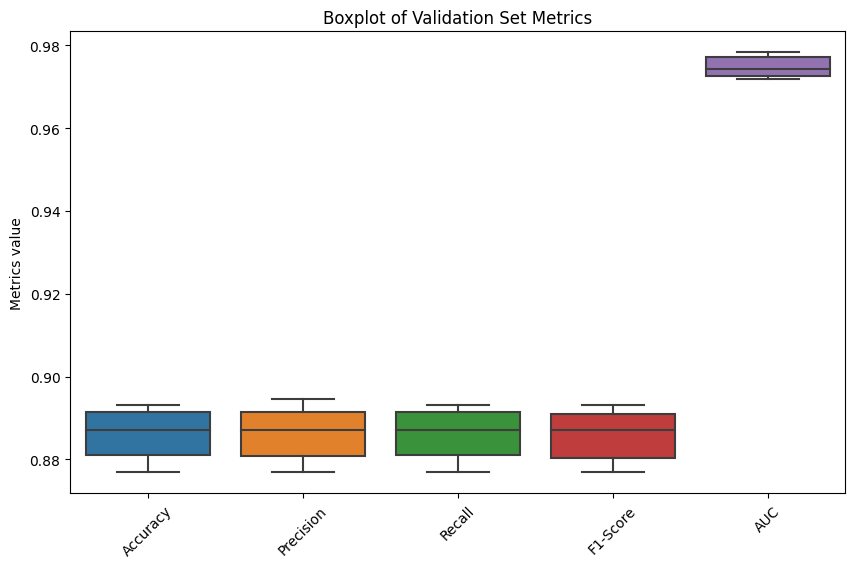

In [20]:
metrics = {
    'Accuracy': accuracies,
    'Precision': precisions,
    'Recall': recalls,
    'F1-Score': f1_scores,
    'AUC': auc_scores
}

metrics_df = pd.DataFrame(metrics)
plt.figure(figsize=(10, 6))  
sns.boxplot(data=metrics_df)

plt.title('Boxplot of Validation Set Metrics')
plt.ylabel('Metrics value')
plt.xticks(rotation=45)
plt.show()

The model demonstrates strong and consistent performance across all metrics. With an average accuracy of 88.60% and low standard deviation (±0.0058), the model reliably classifies the data. Precision, recall, and F1-score are all balanced at 0.89, indicating that the model is both accurate and sensitive in detecting each class. The high AUC-ROC of 0.97 (±0.0024) further confirms the model's excellent ability to distinguish between classes. Overall, the results suggest that the model is both effective and stable.

***Confusion Matrix***

In [ ]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False, 
            xticklabels=['Class 0', 'Class 1', 'Class 2', 'Class 3'], 
            yticklabels=['Class 0', 'Class 1', 'Class 2', 'Class 3'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


The confusion matrix shows that the model classifies most classes correctly, demonstrating good overall performance. However, there is a slight confusion between class 0 and class 1, with some instances of class 0 being misclassified as class 1 and vice versa.

***Metrrics Dataframe**

In [23]:
results = {
    'model': ['SVM (linear kernel)'],   
    'data': ['Test'],                   
    'accuracy': [np.mean(accuracies)],
    'precision': [np.mean(precisions)],
    'recall': [np.mean(recalls)],
    'f1_score': [np.mean(f1_scores)],
    'auc_roc': [np.mean(auc_scores)]
}

metrics_df_svm = pd.DataFrame(results)

In [24]:
print(metrics_df_svm)

                 model  data  accuracy  precision    recall  f1_score  \
0  SVM (linear kernel)  Test  0.885979   0.886439  0.885979  0.885896   

    auc_roc  
0  0.974819  


In [25]:
metrics_df_svm.to_pickle('metrics_df_svm.pkl')

In [28]:
metrics_df_resnet = pd.read_pickle('metrics_df_resnet.pkl')
metrics_df_cnn = pd.read_pickle('metrics_df_cnn.pkl')
metrics_df_cnn_attention = pd.read_pickle('metrics_df_cnn_attention.pkl')

metrics_df = pd.concat(
    [metrics_df_cnn,metrics_df_cnn_attention,metrics_df_resnet, metrics_df_svm], 
    ignore_index=True
)

print(metrics_df)


                 model        data  accuracy  precision    recall        f1  \
0                  CNN       Train  1.000000   1.000000  1.000000  1.000000   
1                  CNN  Validation  0.935989   0.930154  0.929126  0.929570   
2                  CNN        Test  0.911392   0.916022  0.911089  0.910595   
3        CNN_attention       Train  0.991693   0.991379  0.992082  0.991684   
4        CNN_attention  Validation  0.897582   0.890579  0.891177  0.890349   
5        CNN_attention        Test  0.892405   0.890467  0.890091  0.889926   
6               Resnet       Train  0.799051   0.787740  0.790781  0.786050   
7               Resnet  Validation  0.775249   0.753782  0.755662  0.752049   
8               Resnet        Test  0.748418   0.746417  0.741059  0.735030   
9  SVM (linear kernel)        Test  0.885979   0.886439  0.885979  0.885896   

        auc  
0  1.000000  
1  0.991344  
2  0.985722  
3  0.999830  
4  0.984436  
5  0.978368  
6  0.943293  
7  0.931374  
8  0

In [ ]:
metrics_df.to_pickle('metrics_df.pkl')